# Série Temporelle

### Mission

- Le défi de ce projet est de prédire avec précision le futur cours de clôture ajusté de l'ETF sur l'or sur une période donnée dans le futur.

### Descriptif des données
- Type de fichier: fichiier plat (csv);
- Domaine: Marché Financier;
- Données temporelle:
    - Début: 2011-12-15,
    - Fin: 2018-12-31
    - Données journalière selon les jours de cotation/trading => 255 J/Année c-à-d 5 jours ouvrable par semaine excepté les jours férier

### Analyse Exploratoire
- La variable cible est: **Adj Close/Cours de Clôture de l'or** c-à-d Variable à expliquer;
- Nombre des lignes et de colonnes: 
    - Lignes: 1718;
    - Colonnes: 80;
- Il n'a pas de valeur manquante dans le jeu de donnée;
- Les variable sont tous quantitatives;

### La target : Adj Close

- L'or a atteint son plus faible prix/cours de 100.5 USD le **Jeudi 17 Décembre 2015**
- L'or a atteint sa plus grande valeur de 173.61 le **Jeudi 4 Octobre 2012**.

#### Tendance


* D'un point de vue annuel (graphique vert), la tendance globale est:
    - En hausse au cours de l'année **2012**,

    - Ensuite, baissière (l'Or dégrigole) à partir de **2013 jusqu'en 2016**,

    - plutôt haussière entre **2016 et 2019**
    
**L'analyse de l'évolution du cours de l'or pour l'année 2012 pourra être faite dans une section hebdomadaire et journalière et ceci en raison des observations du Cours qui débute en mi-décembre de l'année 2011**


#### ANNEE 2012
- Tendance:
    - haussière de Janvier à Mars;
    - Baissière de Mars à Août
    - Haussière de Août jusqu'en Octobre;
    - Baissière de Octobre jusqu'à Décembre
    
#### ANNEE 2013
- Tendance:
    - baissière de Janvier à Août
    - Haussière de Août à Septembre
    - Baissière de Septembre à Décembre
    
#### ANNEE 2014
- Tendance:
    - Haussière de Janvier à Avril,
    - Baissière de Avril à Juillet,
    - Haussière de Juillet à Août,
    - Baissière de Août à fin Novembre
    - Haussière tout le mois de Décembre

#### ANNEE 2015
- Tendance:
    - Haussière tout le mois de Janvier;
    - Baissière de Février à Avril;
    - Hausse légère de Avril à Mai,
    - Baisse de Mai à Septembre
    - Hausse de Septembre à Novembre
    - Baisse tout le mois de Décembre

#### ANNEE 2016
- Tendance:
    - Haussière de Janvier à Août
    - Baissière de Août à Décembre

#### ANNEE 2017
- Tendance:
    - Haussière de: Janvier à Mars, Avril à Mai, Juin à Juillet, Août à Octobre
    - Baissière de: Mars à Avril, Mai à Juin, Juillet à Août, Octobre à Décembre

#### ANNEE 2018
- Tendance:
    - Baissière de Janvier à Octobre;
    - Haussière de Octobre à Décembre

NB: Analyse sur une période **Hebdomadaire** car la série ne concerne que le mois de Décembre

### Packages

In [145]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from warnings import filterwarnings
filterwarnings('ignore')
from scipy.stats import skew, kurtosis, jarque_bera
from sklearn.preprocessing import StandardScaler

In [3]:
os.chdir('C:/Users/Joel/Desktop/Serie temporelle')

### Données

In [4]:
df = pd.read_csv('FINAL_USO.csv', index_col="Date", parse_dates = True)

In [5]:
df.head()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2011-12-15,154.740005,154.949997,151.710007,152.330002,152.330002,21521900,123.029999,123.199997,121.989998,122.180000,...,51.570000,51.680000,48.973877,20605600,36.900002,36.939999,36.049999,36.130001,36.130001,12616700
2011-12-16,154.309998,155.369995,153.899994,155.229996,155.229996,18124300,122.230003,122.949997,121.300003,121.589996,...,52.040001,52.680000,49.921513,16285400,36.180000,36.500000,35.730000,36.270000,36.270000,12578800
2011-12-19,155.479996,155.860001,154.360001,154.869995,154.869995,12547200,122.059998,122.320000,120.029999,120.290001,...,51.029999,51.169998,48.490578,15120200,36.389999,36.450001,35.930000,36.200001,36.200001,7418200
2011-12-20,156.820007,157.429993,156.580002,156.979996,156.979996,9136300,122.180000,124.139999,120.370003,123.930000,...,52.369999,52.990002,50.215282,11644900,37.299999,37.610001,37.220001,37.560001,37.560001,10041600
2011-12-21,156.979996,157.529999,156.130005,157.160004,157.160004,11996100,123.930000,124.360001,122.750000,124.169998,...,52.419998,52.959999,50.186852,8724300,37.669998,38.240002,37.520000,38.110001,38.110001,10728000


In [6]:
df.tail(5)

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,...,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,
2018-12-24,119.570000,120.139999,119.570000,120.019997,120.019997,9736400,239.039993,240.839996,234.270004,234.339996,...,20.650000,21.090000,21.090000,60507000,9.49,9.52,9.28,9.29,9.29,21598200
2018-12-26,120.620003,121.000000,119.570000,119.660004,119.660004,14293500,235.970001,246.179993,233.759995,246.179993,...,20.530001,20.620001,20.620001,76365200,9.25,9.92,9.23,9.90,9.90,40978800
2018-12-27,120.570000,120.900002,120.139999,120.570000,120.570000,11874400,242.570007,248.289993,238.960007,248.070007,...,20.700001,20.969999,20.969999,52393000,9.59,9.65,9.37,9.62,9.62,36578700
2018-12-28,120.800003,121.080002,120.720001,121.059998,121.059998,6864700,249.580002,251.399994,246.449997,247.750000,...,20.570000,20.600000,20.600000,49835000,9.54,9.65,9.38,9.53,9.53,22803400
2018-12-31,120.980003,121.260002,120.830002,121.250000,121.250000,8449400,249.559998,250.190002,247.470001,249.919998,...,20.559999,21.090000,21.090000,53866600,9.63,9.71,9.44,9.66,9.66,28417400


### Nombre de ligne et de colonnes

In [5]:
df.shape

(1718, 80)

In [6]:
print("Le nombre de ligne est: ", df.shape[0] , "Le nombre de Colonne est: ", df.shape[1])

Le nombre de ligne est:  1718 Le nombre de Colonne est:  80


#### Valeur manquante

In [7]:
df.isna().sum().sum()

0

In [10]:
df.isna().sum()

Open             0
High             0
Low              0
Close            0
Adj Close        0
Volume           0
SP_open          0
SP_high          0
SP_low           0
SP_close         0
SP_Ajclose       0
SP_volume        0
DJ_open          0
DJ_high          0
DJ_low           0
DJ_close         0
DJ_Ajclose       0
DJ_volume        0
EG_open          0
EG_high          0
EG_low           0
EG_close         0
EG_Ajclose       0
EG_volume        0
EU_Price         0
EU_open          0
EU_high          0
EU_low           0
EU_Trend         0
OF_Price         0
OF_Open          0
OF_High          0
OF_Low           0
OF_Volume        0
OF_Trend         0
OS_Price         0
OS_Open          0
OS_High          0
OS_Low           0
OS_Trend         0
SF_Price         0
SF_Open          0
SF_High          0
SF_Low           0
SF_Volume        0
SF_Trend         0
USB_Price        0
USB_Open         0
USB_High         0
USB_Low          0
USB_Trend        0
PLT_Price        0
PLT_Open    

- Il n'y a pas de valeurs manquantes dans le Jeu de donnée

#### Les types de Variables

In [9]:
pd.set_option("display.max_rows", df.shape[1])

In [18]:
df.dtypes

Open             float64
High             float64
Low              float64
Close            float64
Adj Close        float64
Volume             int64
SP_open          float64
SP_high          float64
SP_low           float64
SP_close         float64
SP_Ajclose       float64
SP_volume          int64
DJ_open          float64
DJ_high          float64
DJ_low           float64
DJ_close         float64
DJ_Ajclose       float64
DJ_volume          int64
EG_open          float64
EG_high          float64
EG_low           float64
EG_close         float64
EG_Ajclose       float64
EG_volume          int64
EU_Price         float64
EU_open          float64
EU_high          float64
EU_low           float64
EU_Trend           int64
OF_Price         float64
OF_Open          float64
OF_High          float64
OF_Low           float64
OF_Volume          int64
OF_Trend           int64
OS_Price         float64
OS_Open          float64
OS_High          float64
OS_Low           float64
OS_Trend           int64


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1718 entries, 2011-12-15 to 2018-12-31
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Open           1718 non-null   float64
 1   High           1718 non-null   float64
 2   Low            1718 non-null   float64
 3   Close          1718 non-null   float64
 4   Adj Close      1718 non-null   float64
 5   Volume         1718 non-null   int64  
 6   SP_open        1718 non-null   float64
 7   SP_high        1718 non-null   float64
 8   SP_low         1718 non-null   float64
 9   SP_close       1718 non-null   float64
 10  SP_Ajclose     1718 non-null   float64
 11  SP_volume      1718 non-null   int64  
 12  DJ_open        1718 non-null   float64
 13  DJ_high        1718 non-null   float64
 14  DJ_low         1718 non-null   float64
 15  DJ_close       1718 non-null   float64
 16  DJ_Ajclose     1718 non-null   float64
 17  DJ_volume      1718 non-null   int

In [20]:
df.dtypes.value_counts()

float64    58
int64      22
dtype: int64

- Tous les Variables sont des quantitatives (y compris la cible) => **Problème de régression en appritissage supervisé**

### Visualisation de la target: Adj Close

In [18]:
df['Adj Close']

Date
2011-12-15    152.330002
2011-12-16    155.229996
2011-12-19    154.869995
2011-12-20    156.979996
2011-12-21    157.160004
                 ...    
2018-12-24    120.019997
2018-12-26    119.660004
2018-12-27    120.570000
2018-12-28    121.059998
2018-12-31    121.250000
Name: Adj Close, Length: 1718, dtype: float64

In [11]:
df['Adj Close'].isna().sum()

0

In [24]:
print(df['Adj Close'].idxmin())

2015-12-17 00:00:00


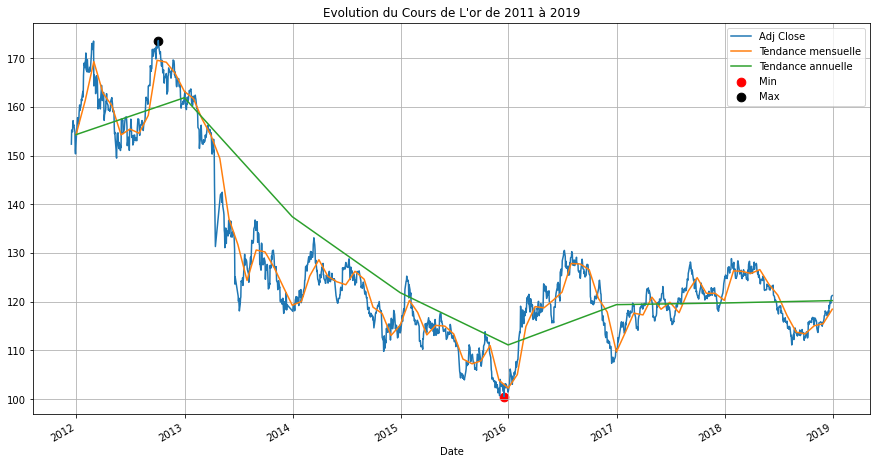

In [99]:
plt.figure(figsize=(15, 8))
plt.title('Evolution du Cours de L\'or de 2011 à 2019')
df['Adj Close'].plot()
plt.scatter(df['Adj Close'].idxmin(), df['Adj Close'].min(), marker='.', c='r', s=300, label="Min")
plt.scatter(df['Adj Close'].idxmax(), df['Adj Close'].max(), marker='.', c='black', s=300, label="Max")
plt.plot(df['Adj Close'].resample('M').mean(), label='Tendance mensuelle')
plt.plot(df['Adj Close'].resample('Y').mean(), label='Tendance annuelle')
plt.legend()
plt.grid()

In [34]:
print("Cours minimal de l'or: ", df['Adj Close'].min(), "Jour: ", df['Adj Close'].idxmin(), "\n\n")
print("Cours maximal de l'or: ", df['Adj Close'].max(), "Jour: ", df['Adj Close'].idxmax())

Cours minimal de l'or:  100.5 Jour:  2015-12-17 00:00:00 


Cours maximal de l'or:  173.610001 Jour:  2012-10-04 00:00:00


- L'or a atteint son plus faible prix/cours de 100.5 USD le **Jeudi 17 Décembre 2015**
- L'or a atteint sa plus grande valeur de 173.61 le **Jeudi 4 Octobre 2012**.

#### Tendance


* D'un point de vue annuel (graphique vert), la tendance globale est:
    - En hausse au cours de l'année **2012**,

    - Ensuite, baissière (l'Or dégrigole) à partir de **2013 jusqu'en 2016**,

    - plutôt haussière entre **2016 et 2019**

 - Globalement la plus grande baisse du **Cours de l'or est dans les derniers mois de l'année 2015** (Il serait intéressant de comprendre ce qui s'est passé en cette année 2015 sur le marché de l'or)

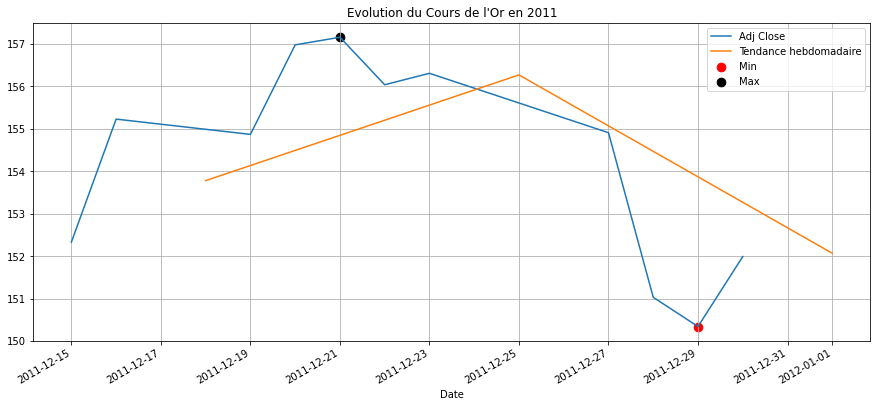

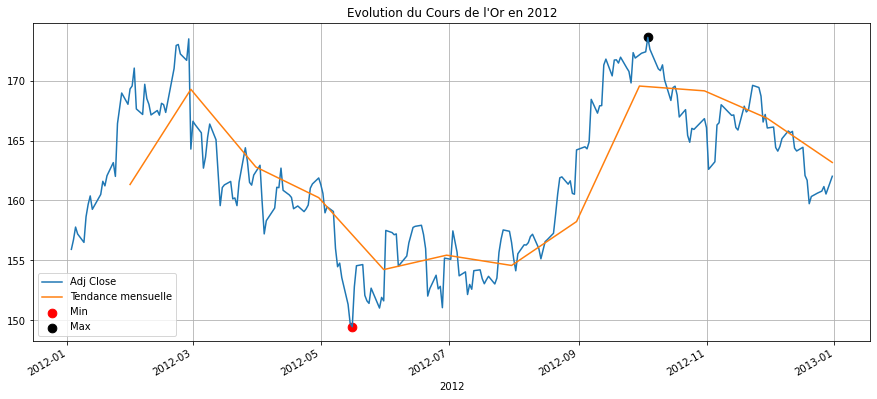

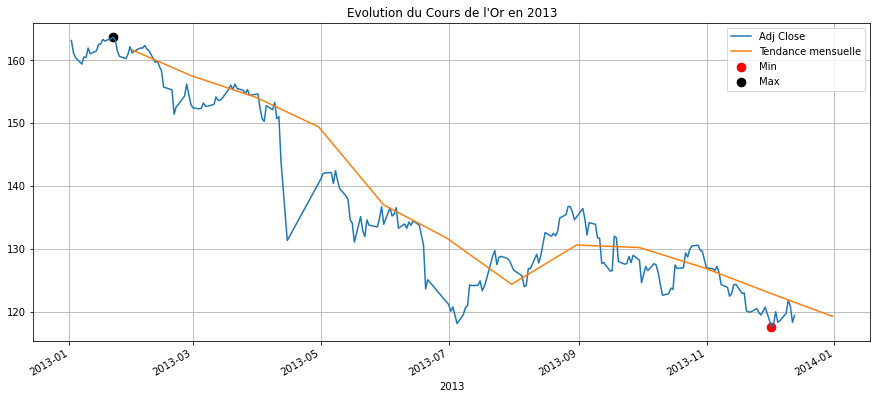

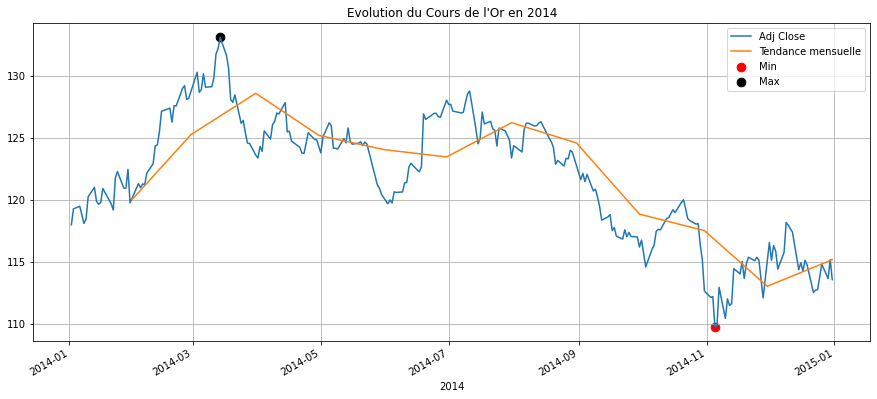

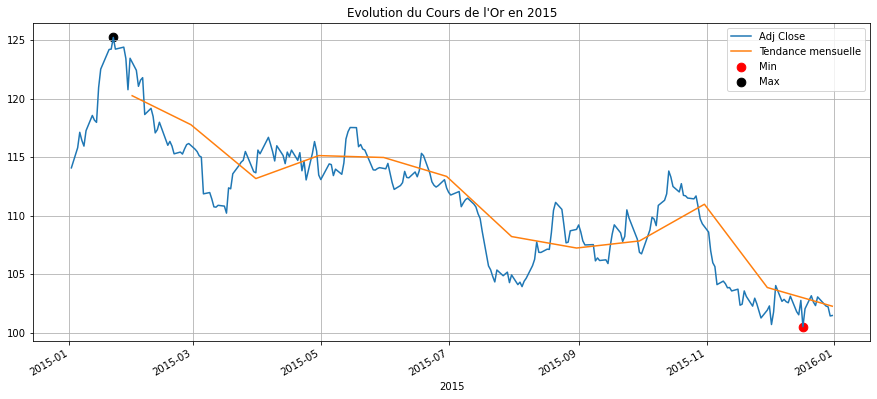

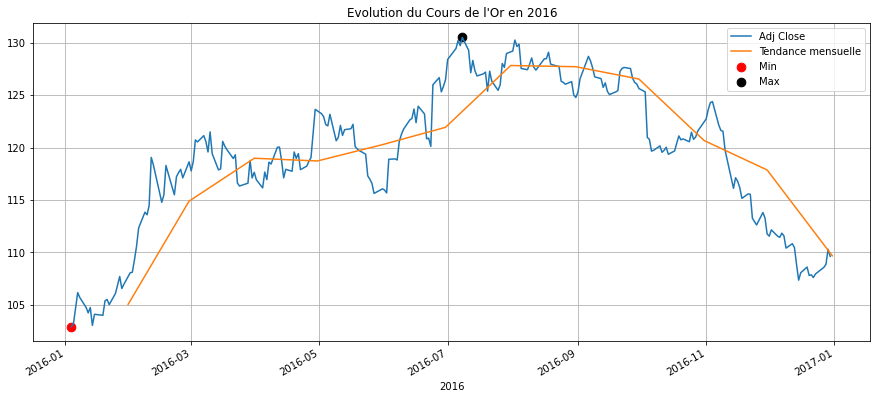

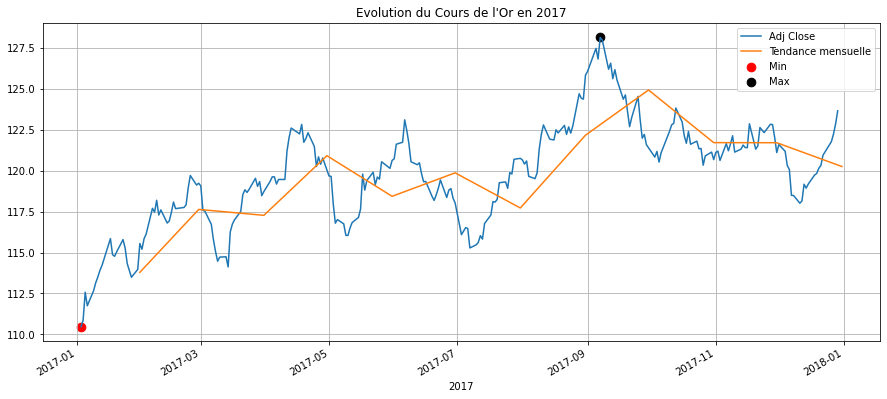

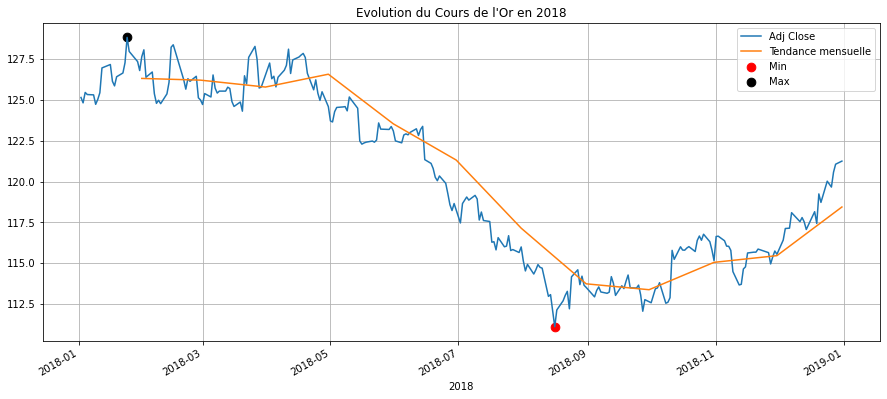

In [115]:
for date in range(2011, 2019):
    plt.figure(figsize=(15, 6.5))
    if date == 2011:
        plt.title('Evolution du Cours de l\'Or en ' + str(date))
        df.loc[str(date), 'Adj Close'].plot()
        plt.scatter(df['Adj Close'][str(date)].idxmin(), df['Adj Close'][str(date)].min(), marker='.', c="r", s=300, label="Min")
        plt.scatter(df['Adj Close'][str(date)].idxmax(), df['Adj Close'][str(date)].max(), marker='.', c='black', s=300, label="Max")
        plt.plot(df['Adj Close'][str(date)].resample('W').mean(), label='Tendance hebdomadaire')
        plt.legend()
        plt.grid()
    else:
        plt.title('Evolution du Cours de l\'Or en ' + str(date))
        df.loc[str(date), 'Adj Close'].plot()
        plt.scatter(df['Adj Close'][str(date)].idxmin(), df['Adj Close'][str(date)].min(), marker='.', c="r", s=300, label="Min")
        plt.scatter(df['Adj Close'][str(date)].idxmax(), df['Adj Close'][str(date)].max(), marker='.', c='black', s=300, label="Max")
        plt.plot(df['Adj Close'][str(date)].resample('M').mean(), label='Tendance mensuelle')
        plt.grid()
        plt.xlabel(str(date))
        plt.legend()

**L'analyse de l'évolution du cours de l'or pourra être faite dans une section hebdomadaire et journalière et ceci en raison des observations du Cours qui débute en mi-décembre de l'année 2011**


#### ANNEE 2012
- Tendance:
    - haussière de Janvier à Mars;
    - Baissière de Mars à Août
    - Haussière de Août jusqu'en Octobre;
    - Baissière de Octobre jusqu'à Décembre
    
#### ANNEE 2013
- Tendance:
    - baissière de Janvier à Août
    - Haussière de Août à Septembre
    - Baissière de Septembre à Décembre
    
#### ANNEE 2014
- Tendance:
    - Haussière de Janvier à Avril,
    - Baissière de Avril à Juillet,
    - Haussière de Juillet à Août,
    - Baissière de Août à fin Novembre
    - Haussière tout le mois de Décembre

#### ANNEE 2015
- Tendance:
    - Haussière tout le mois de Janvier;
    - Baissière de Février à Avril;
    - Hausse légère de Avril à Mai,
    - Baisse de Mai à Septembre
    - Hausse de Septembre à Novembre
    - Baisse tout le mois de Décembre

#### ANNEE 2016
- Tendance:
    - Haussière de Janvier à Août
    - Baissière de Août à Décembre

#### ANNEE 2017
- Tendance:
    - Haussière de: Janvier à Mars, Avril à Mai, Juin à Juillet, Août à Octobre
    - Baissière de: Mars à Avril, Mai à Juin, Juillet à Août, Octobre à Décembre

#### ANNEE 2018
- Tendance:
    - Baissière de Janvier à Octobre;
    - Haussière de Octobre à Décembre

NB: Analyse sur une période **Hebdomadaire** car la série ne concerne que le mois de Décembre

#### Visualisation Hebdomadaire

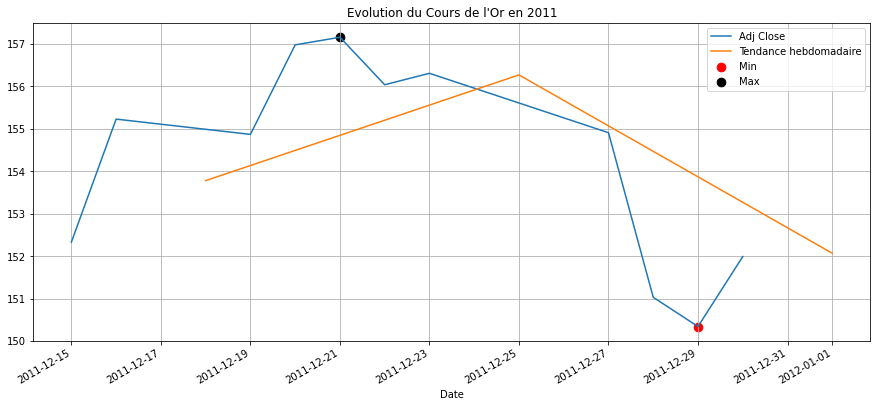

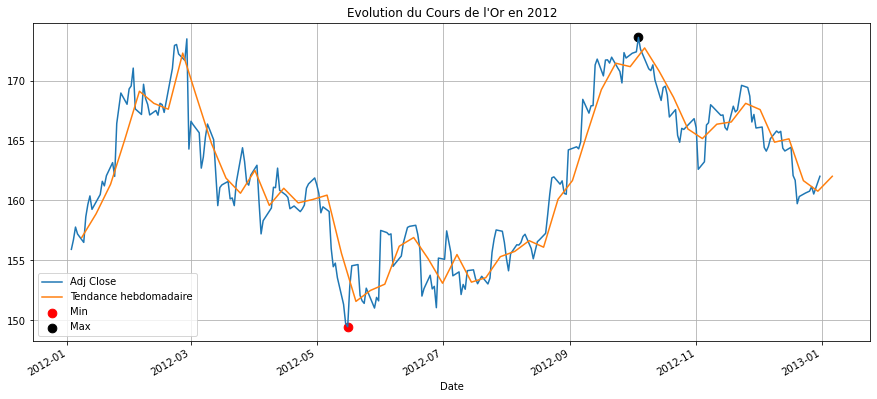

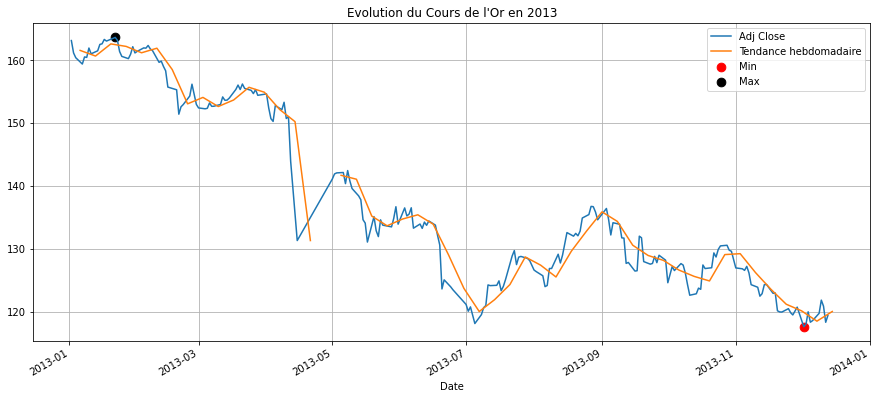

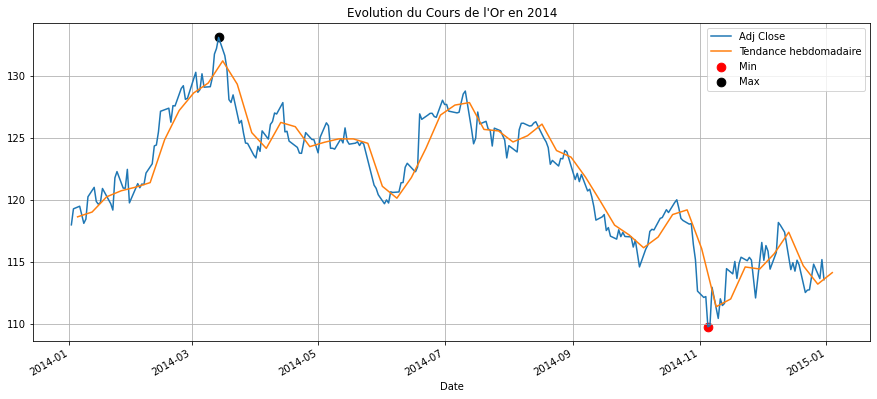

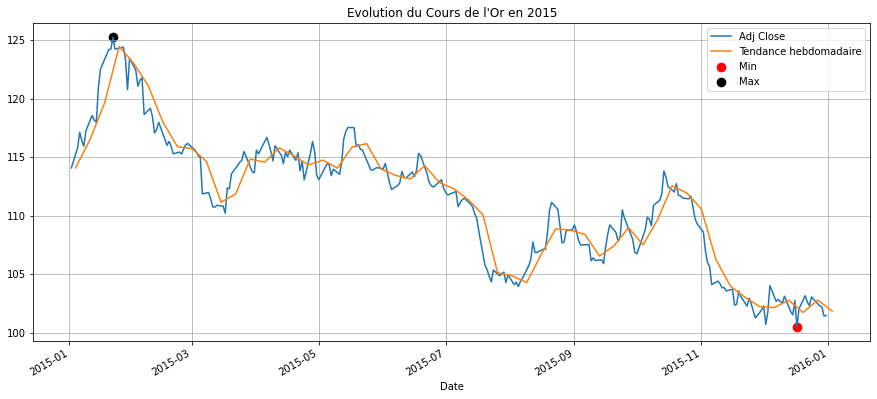

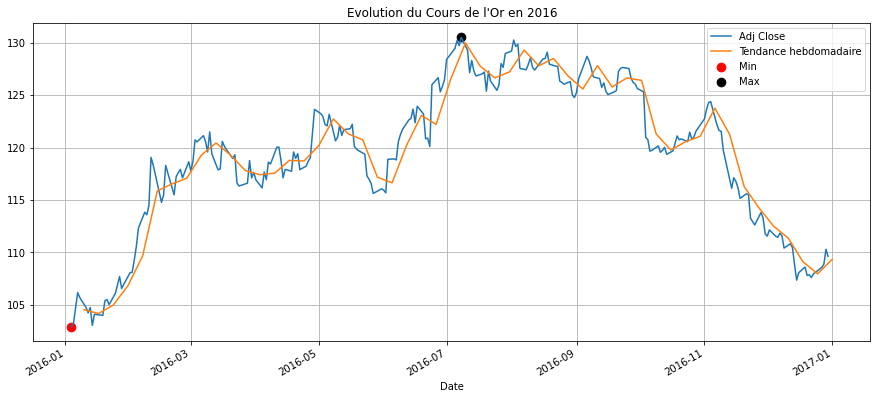

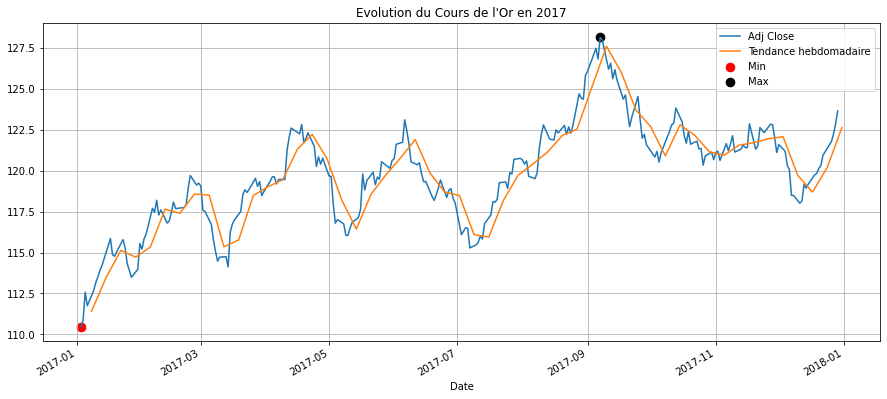

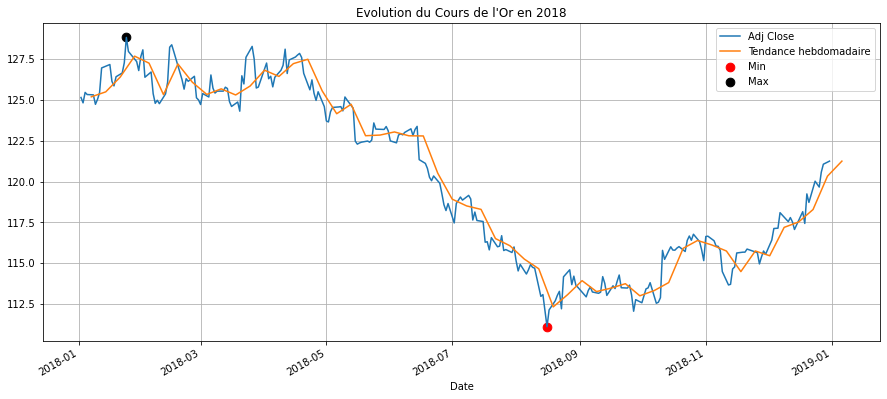

In [119]:
#df['Adj Close']['2011'].plot.line()
for date in range(2011, 2019):
    plt.figure(figsize=(15, 6.5))
    #if date == 2011:
    plt.title('Evolution du Cours de l\'Or en ' + str(date))
    df.loc[str(date), 'Adj Close'].plot()
    plt.scatter(df['Adj Close'][str(date)].idxmin(), df['Adj Close'][str(date)].min(), marker='.', c="r", s=300, label="Min")
    plt.scatter(df['Adj Close'][str(date)].idxmax(), df['Adj Close'][str(date)].max(), marker='.', c='black', s=300, label="Max")
    plt.plot(df['Adj Close'][str(date)].resample('W').mean(), label='Tendance hebdomadaire')
    plt.legend()
    plt.grid()

#### Visualisation Journalière

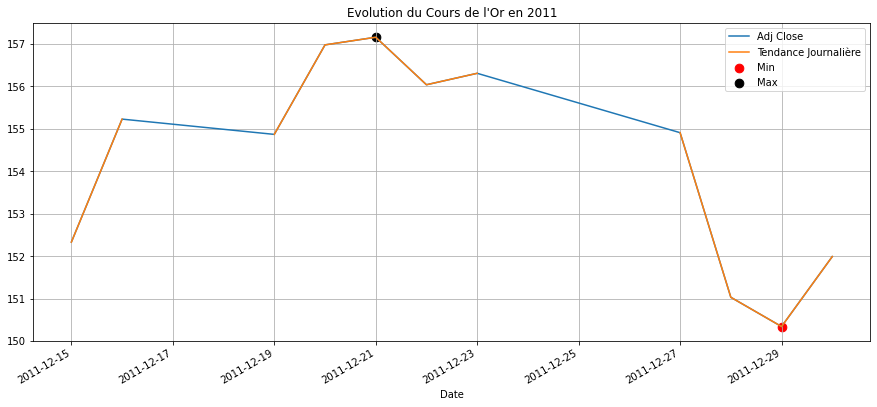

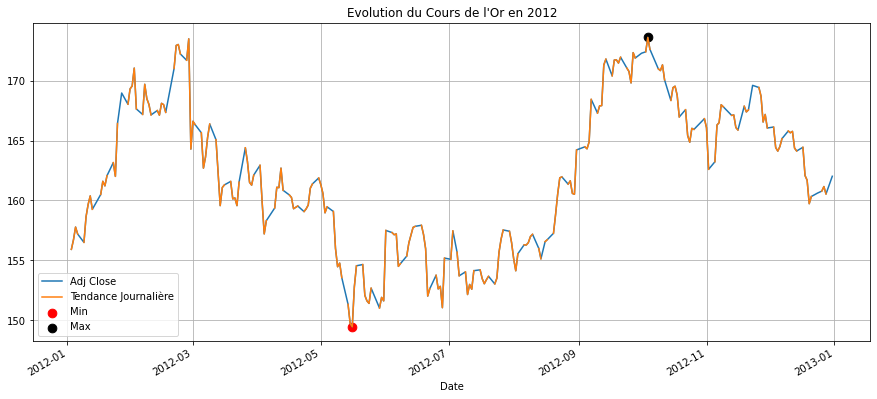

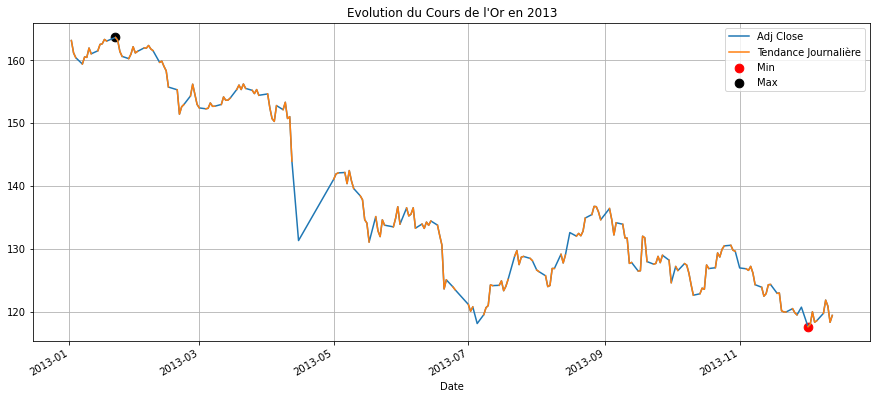

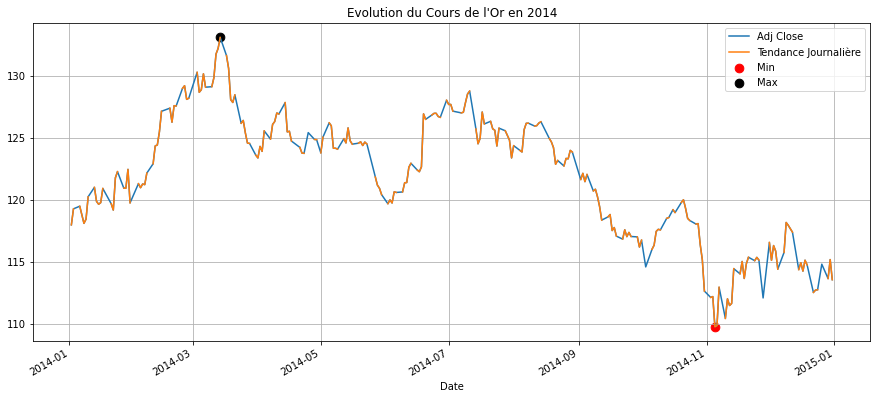

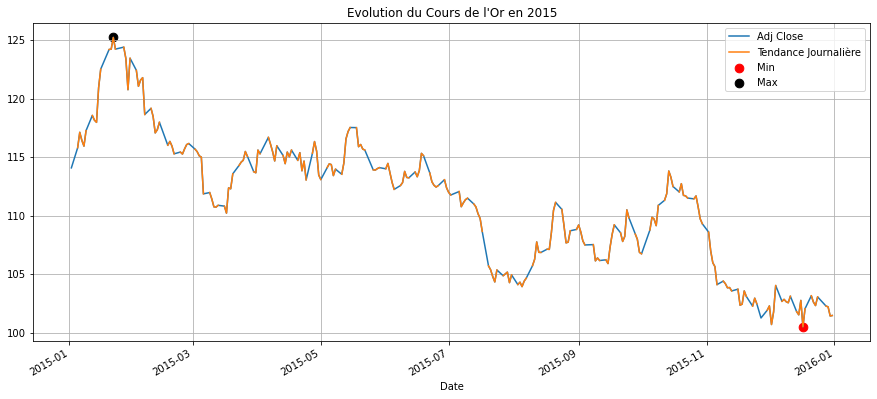

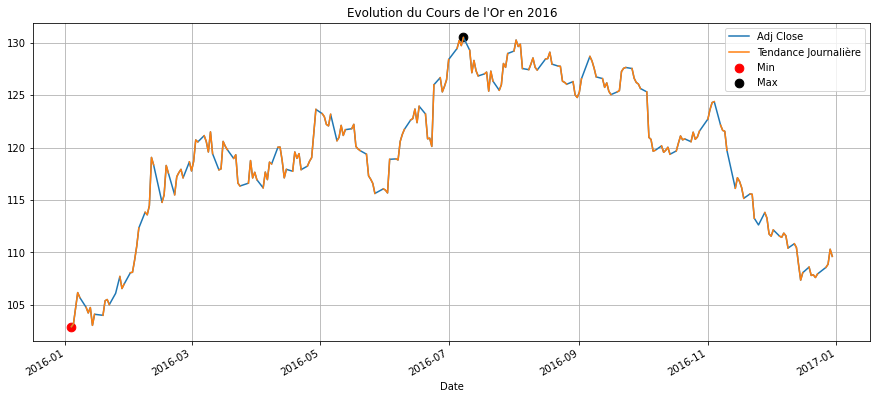

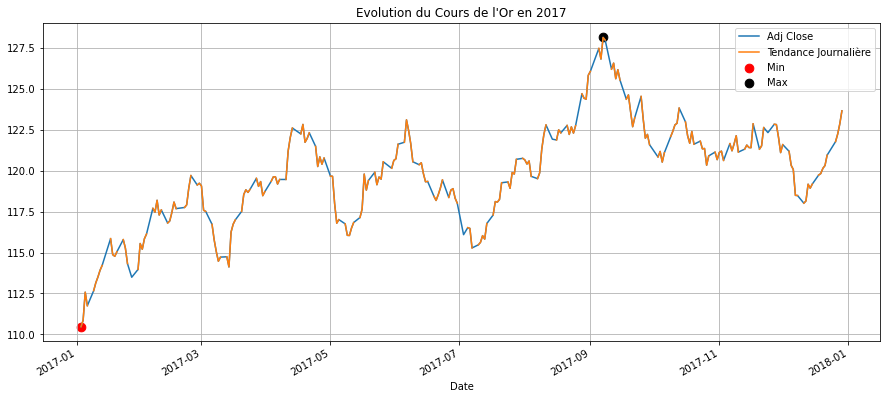

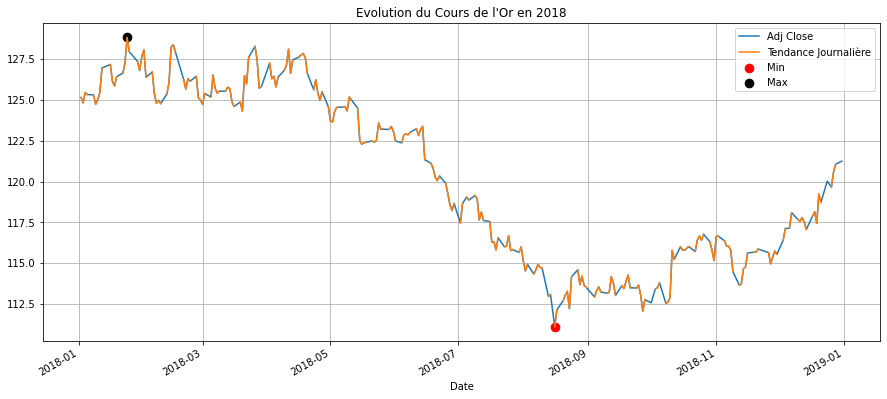

In [120]:
#df['Adj Close']['2011'].plot.line()
for date in range(2011, 2019):
    plt.figure(figsize=(15, 6.5))
    #if date == 2011:
    plt.title('Evolution du Cours de l\'Or en ' + str(date))
    df.loc[str(date), 'Adj Close'].plot()
    plt.scatter(df['Adj Close'][str(date)].idxmin(), df['Adj Close'][str(date)].min(), marker='.', c="r", s=300, label="Min")
    plt.scatter(df['Adj Close'][str(date)].idxmax(), df['Adj Close'][str(date)].max(), marker='.', c='black', s=300, label="Max")
    plt.plot(df['Adj Close'][str(date)].resample('D').mean(), label='Tendance Journalière')
    plt.legend()
    plt.grid()

### Distribution

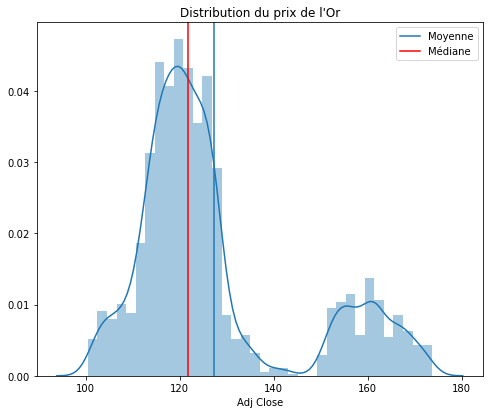

In [127]:
plt.figure(figsize=(8, 6.5))
sns.distplot(df['Adj Close'])
plt.axvline(df['Adj Close'].mean(), label = 'Moyenne')
plt.axvline(df['Adj Close'].median(), label = 'Médiane', c='r')
plt.title('Distribution du prix de l\'Or')
plt.legend();

In [194]:
skew(df['Adj Close'])

1.16538380833544

- Moyenne > Médiane et skew > 0 cela implique que La majorité des prix sont supérieurs à la moyenne (distribution étalée à droite/asymétrique)

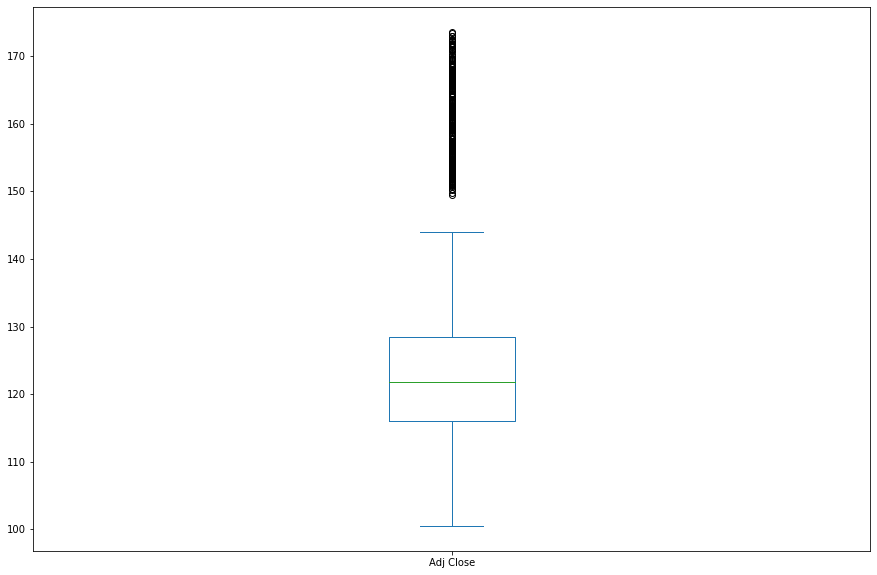

In [135]:
plt.figure(figsize=(15, 10))

df['Adj Close'].plot.box();

- Il existe des valeurs abérrantes

### Compréhension des différentes variables

In [140]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open',
       'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open',
       'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open',
       'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price',
       'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open',
       'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open',
       'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High',
       'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO

In [146]:
df.nunique().sort_values()

OS_Trend            2
SF_Trend            2
EU_Trend            2
PLT_Trend           2
PLD_Trend           2
USDI_Trend          2
USB_Trend           2
OF_Trend            2
RHO_PRICE         230
EG_open           809
EG_low            823
EG_close          831
EG_high           836
USB_Low           999
USB_Price        1014
USB_Open         1020
USB_High         1036
EG_Ajclose       1091
USO_High         1102
USO_Low          1124
USO_Open         1124
USO_Close        1128
USO_Adj Close    1128
GDX_Close        1137
GDX_High         1147
GDX_Low          1152
GDX_Open         1152
EU_high          1259
EU_Price         1268
EU_open          1282
EU_low           1292
USDI_Open        1297
USDI_Low         1317
USDI_High        1330
Low              1356
Open             1363
High             1368
SF_Volume        1369
Close            1384
Adj Close        1384
USDI_Volume      1389
OS_Open          1456
OF_High          1458
OF_Open          1462
OS_High          1465
OS_Price  

- 72 variables y compris la cible (Adj Close) ont plus de 200 modalités.
- 8 variables ont 2 modalités. Ce sont toutes les variables relatives au Trend (OS_Trend, SF_Trend, EU_Trend, PLT_Trend, PLD_Trend, USDI_Trend,  USB_Trend, OF_Trend)

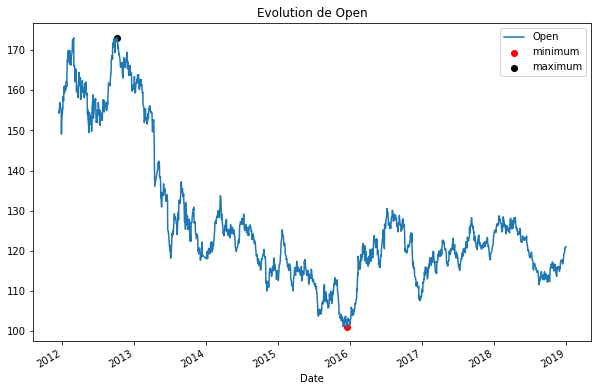

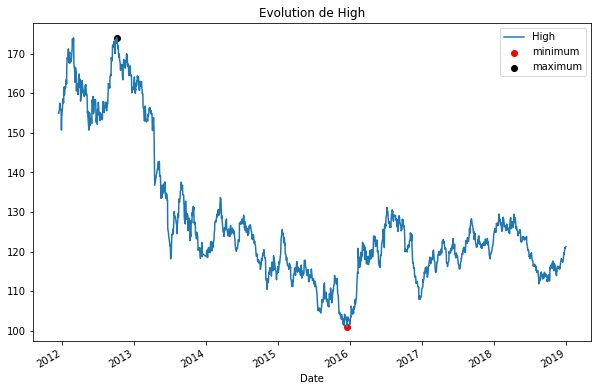

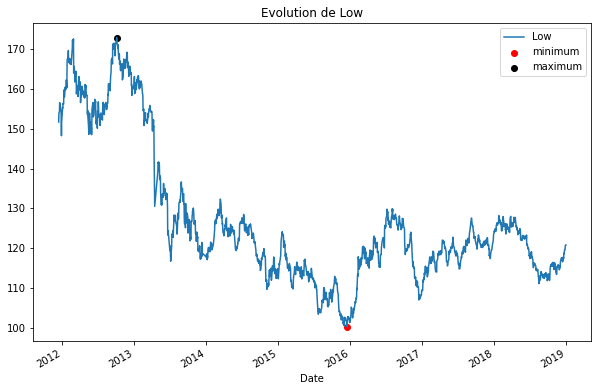

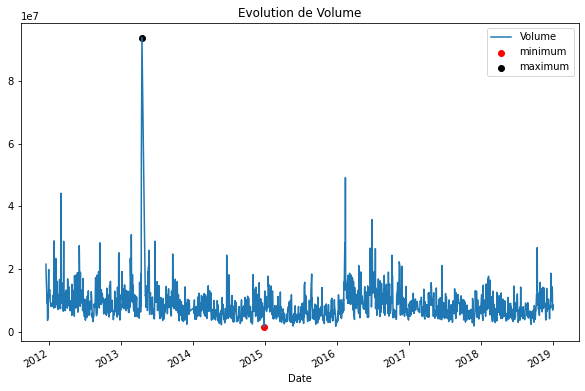

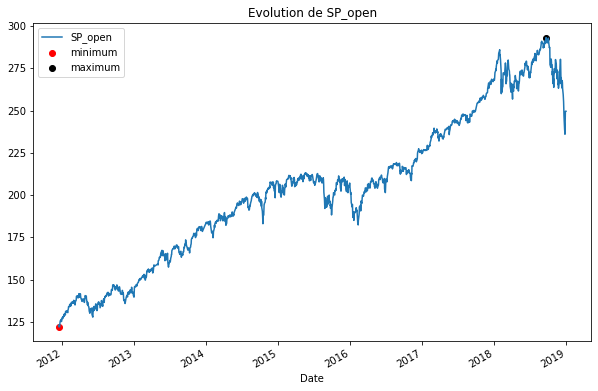

...

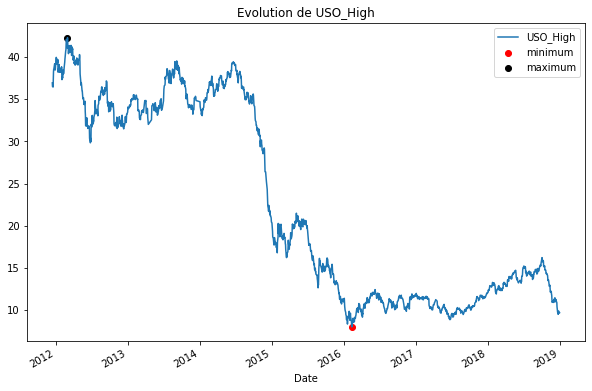

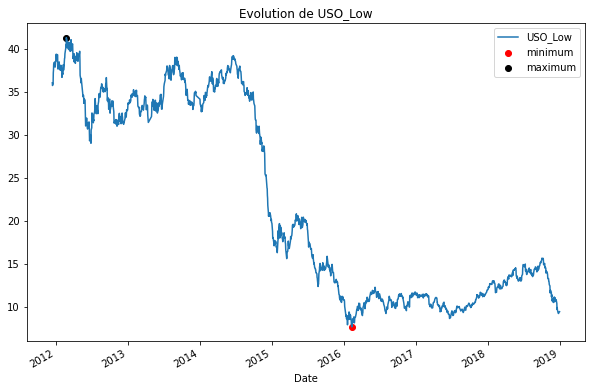

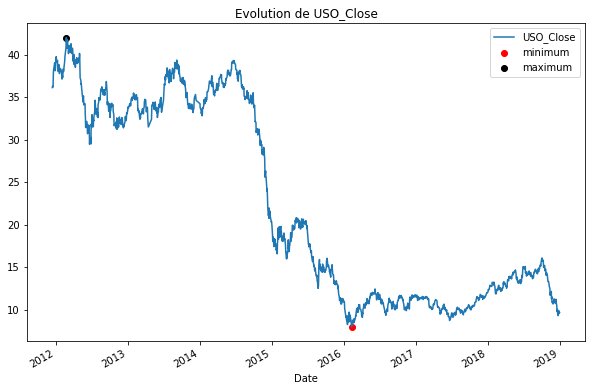

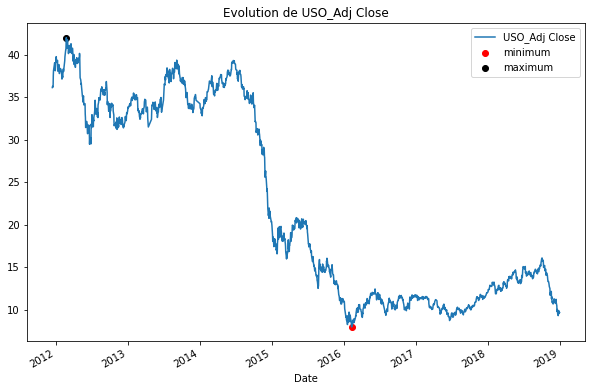

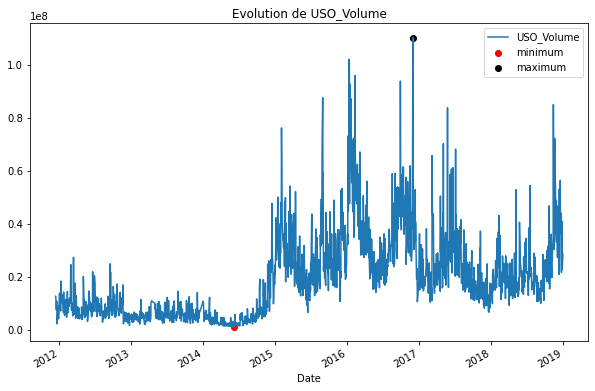

In [74]:
for col in df:
    if col not in 'Adj Close' and df[col].nunique() > 2:
        plt.figure(figsize=(10, 6.5))
        plt.title("Evolution de " + col)
        df[col].plot()
        plt.scatter(df[col].idxmin(), df[col].min(), label='minimum', c='r')
        plt.scatter(df[col].idxmax(), df[col].max(), label='maximum', c='black')
        plt.legend()
    elif df[col].nunique() <= 2:
        plt.figure(figsize=(10, 6.5))
        plt.title("Evolution de " + col)
        sns.countplot(df[col])

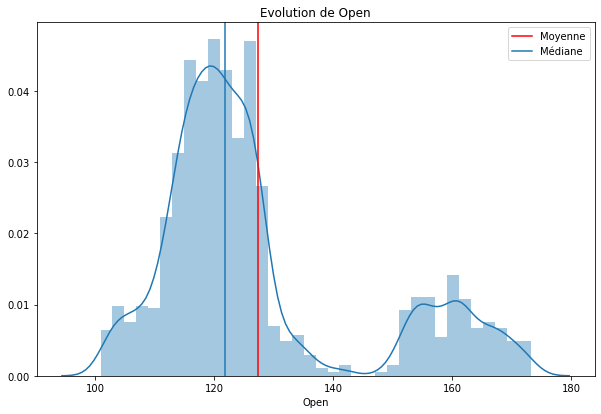

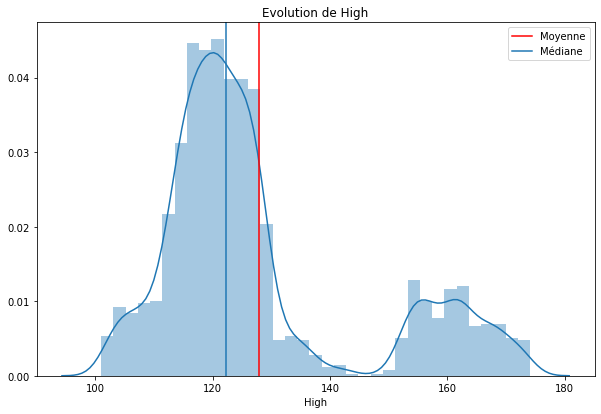

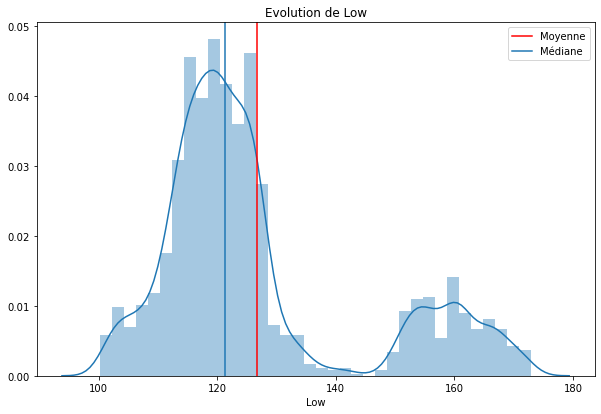

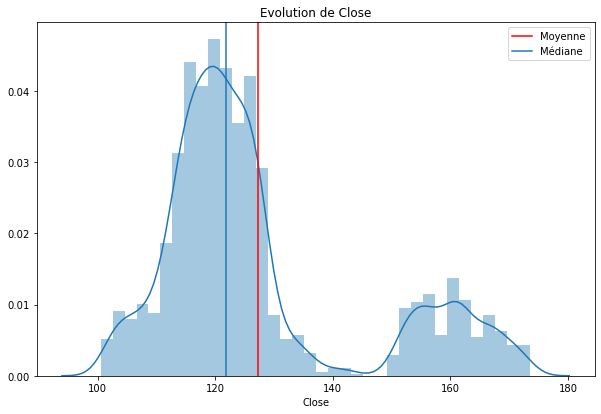

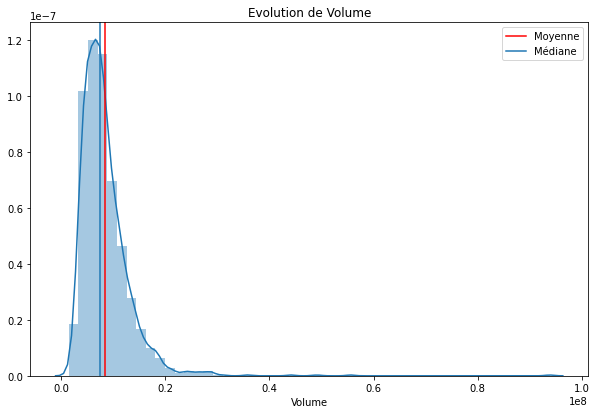

...

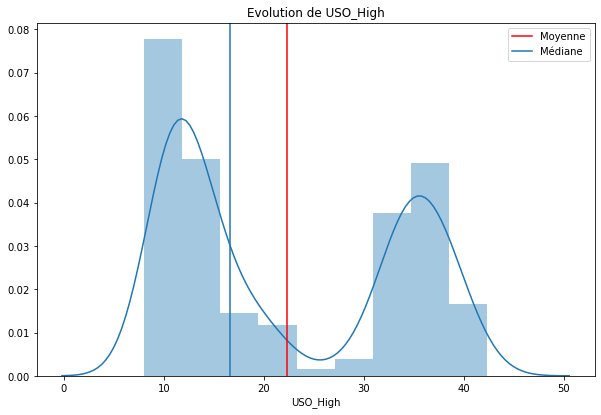

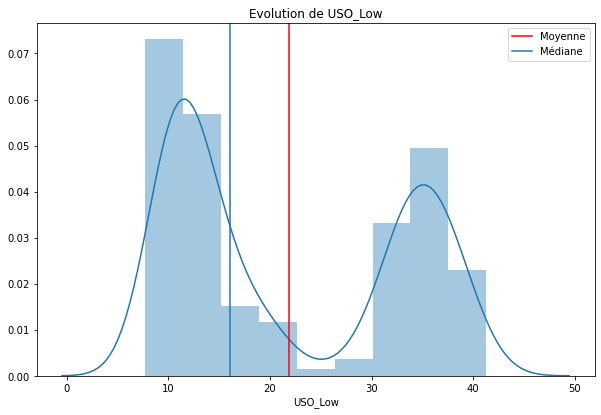

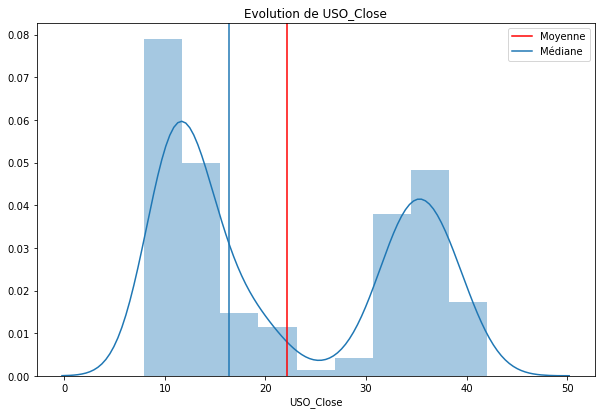

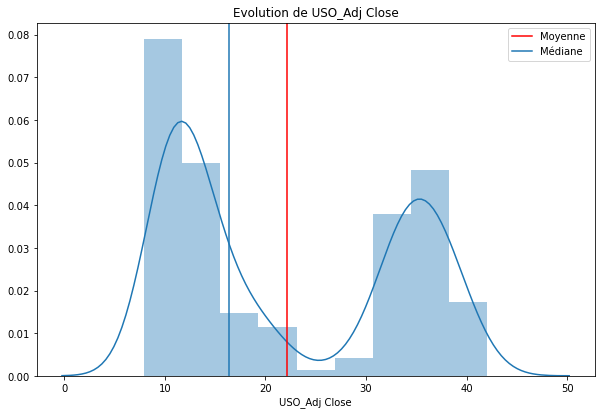

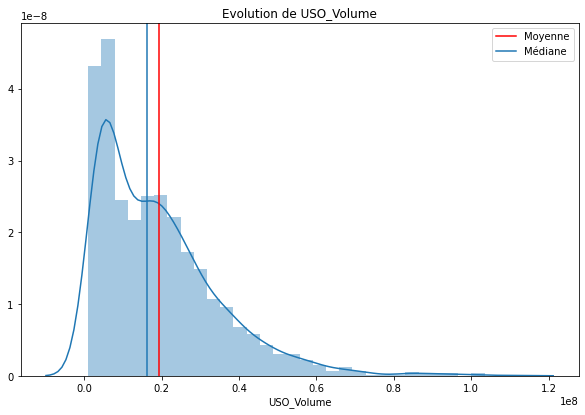

In [59]:
for col in df:
    if col not in ['Adj Close', 'SP_volume', 'DJ_volume'] and df[col].nunique() > 2:
        plt.figure(figsize=(10, 6.5))
        plt.title("Evolution de " + col)
        sns.distplot(df[col])
        plt.axvline(df[col].mean(), label = 'Moyenne', c='r')
        plt.axvline(df[col].median(), label = 'Médiane')
        plt.legend()

In [55]:
pd.set_option('display.max_rows', df.shape[1])
df[[col for col in df if col not in 'Adj Close' and df[col].nunique()]].apply(skew).sort_values()

USDI_Price      -0.152919
USDI_High       -0.152518
USDI_Low        -0.150522
USDI_Open       -0.150434
PLD_Trend       -0.123635
USDI_Trend      -0.051239
OS_Trend        -0.013970
OF_Trend         0.004657
EU_Trend         0.020956
OF_Volume        0.032335
USB_Trend        0.039589
PLT_Trend        0.062895
SF_Trend         0.076890
SP_low           0.084616
SP_close         0.085775
SP_open          0.087813
SP_high          0.089237
USB_High         0.091979
USB_Price        0.112391
USB_Open         0.114210
USB_Low          0.127344
SP_Ajclose       0.170040
OF_Open          0.171070
OF_Low           0.171814
OF_Price         0.172320
OF_High          0.172366
OS_Open          0.186475
OS_Low           0.186681
OS_Price         0.187314
OS_High          0.188487
EU_high          0.194117
EU_open          0.197791
EU_Price         0.200385
EU_low           0.203637
USO_High         0.304735
USO_Open         0.308234
USO_Adj Close    0.309208
USO_Close        0.309208
USO_Low     

### Selon les graphiques de répartition et le coéfficient de d asymétrique (skewness) :

    - Les distributions sont symétriques pour l'indice Standard & Poor, OF_volume, et toutes les variables rélatives aux obligations(USB);
    - Tous les autres variables sont asymétriques (distribution étalée à droite). La Plupart des valeurs sont supérieures à la moyenne;
    - On constate que les distributions se ressemblent par bloc:
        -  Open ,  High ,  Low ,  Close ,  Adj Close ,  Volume ;
        -  DJopen , DJhigh ,  DJlow ,  DJclose ,  DJAjclose ,  DJvolume;
        -  SPopen ,  SPhigh ,  SPlow ,  SPclose ,  SPAjclose ,  SPvolume;
        -  EGopen ,  EGhigh ,  EGlow ,  EGclose ,  EGAjclose ,  EGvolume;
        -  EUPrice ,  EUopen ,  EUhigh ,   EUlow ,  EUTrend ;
        -  EUPrice ,  EUopen ,  EUhigh ,   EUlow ,  EUTrend ;
        -  OSPrice ,  OSOpen ,   OSHigh ,  OSLow ,  OSTrend ;
        -  OSPrice ,  OSOpen ,   OSHigh ,  OSLow ,  OSTrend ;
        -  USBPrice ,  USBOpen  ,  USBHigh ,  USBLow ,  USBTrend ;
        -  USBPrice ,  USBOpen  ,  USBHigh ,  USBLow ,  USBTrend ;
        -  PLDPrice ,  PLDOpen ,  PLDHigh ,  PLDLow ,  PLDTrend ;
        -  USDIPrice ,  USDIOpen ,  USDIHigh ,  USDILow ,  USDIVolume ,  USDITrend ;
        -  GDXOpen ,  GDXHigh ,  GDXLow ,  GDXClose ,  GDXAdj Close ,  GDX Volume ;
        -  USOOpen ,  USOHigh ,  USOLow ,  USOClose ,  USOAdj Close ,  USOVolume
        
**Il serait intéressant de tenir compte des ces blocs ici présent**

In [99]:
volume = ['Volume', 'SP_volume', 'DJ_volume', 'EG_volume', 'OF_Volume', 'SF_Volume', 'USDI_Volume', 'GDX_Volume', 'USO_Volume']
Or = ['Open', 'High', 'Low', 'Close', 'Adj Close']
SP = ['SP_open', 'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose']
DJ = ['DJ_open', 'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose']
EG = ['EG_open', 'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EU_Price']
EU = ['EU_Price', 'EU_open', 'EU_high', 'EU_low', 'EU_Trend']
OF = ['OF_Price', 'OF_Open', 'OF_High', 'OF_Low', 'OF_Trend']
OS = ['OS_Price', 'OS_Open', 'OS_High', 'OS_Low', 'OS_Trend']
SF = ['SF_Price', 'SF_Open', 'SF_High','SF_Low', 'SF_Trend']
USB = ['USB_Price', 'USB_Open', 'USB_High', 'USB_Low', 'USB_Trend']
PLT = ['PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low', 'PLT_Trend']
PLD = ['PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low', 'PLD_Trend']

### Relation Target/Feature

In [96]:
df.columns

Index(['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume', 'SP_open',
       'SP_high', 'SP_low', 'SP_close', 'SP_Ajclose', 'SP_volume', 'DJ_open',
       'DJ_high', 'DJ_low', 'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_open',
       'EG_high', 'EG_low', 'EG_close', 'EG_Ajclose', 'EG_volume', 'EU_Price',
       'EU_open', 'EU_high', 'EU_low', 'EU_Trend', 'OF_Price', 'OF_Open',
       'OF_High', 'OF_Low', 'OF_Volume', 'OF_Trend', 'OS_Price', 'OS_Open',
       'OS_High', 'OS_Low', 'OS_Trend', 'SF_Price', 'SF_Open', 'SF_High',
       'SF_Low', 'SF_Volume', 'SF_Trend', 'USB_Price', 'USB_Open', 'USB_High',
       'USB_Low', 'USB_Trend', 'PLT_Price', 'PLT_Open', 'PLT_High', 'PLT_Low',
       'PLT_Trend', 'PLD_Price', 'PLD_Open', 'PLD_High', 'PLD_Low',
       'PLD_Trend', 'RHO_PRICE', 'USDI_Price', 'USDI_Open', 'USDI_High',
       'USDI_Low', 'USDI_Volume', 'USDI_Trend', 'GDX_Open', 'GDX_High',
       'GDX_Low', 'GDX_Close', 'GDX_Adj Close', 'GDX_Volume', 'USO_Open',
       'USO_High', 'USO

In [111]:
pd.set_option('display.max_columns', df.shape[1])
df.describe()

,Open,High,Low,Close,Adj Close,Volume,SP_open,SP_high,SP_low,SP_close,SP_Ajclose,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_open,EG_high,EG_low,EG_close,EG_Ajclose,EG_volume,EU_Price,EU_open,EU_high,EU_low,EU_Trend,OF_Price,OF_Open,OF_High,OF_Low,OF_Volume,OF_Trend,OS_Price,OS_Open,OS_High,OS_Low,OS_Trend,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,SF_Trend,USB_Price,USB_Open,USB_High,USB_Low,USB_Trend,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLT_Trend,PLD_Price,PLD_Open,PLD_High,PLD_Low,PLD_Trend,RHO_PRICE,USDI_Price,USDI_Open,USDI_High,USDI_Low,USDI_Volume,USDI_Trend,GDX_Open,GDX_High,GDX_Low,GDX_Close,GDX_Adj Close,GDX_Volume,USO_Open,USO_High,USO_Low,USO_Close,USO_Adj Close,USO_Volume
count,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03,1718.000000,1718.000000,1718.000000,1718.000000,1718.000000,1.718000e+03
mean,127.323434,127.854237,126.777695,127.319482,127.319482,8.446327e+06,204.490023,205.372637,203.487014,204.491222,192.204570,1.098026e+08,18161.094398,18244.137842,18073.889095,18164.119043,18164.119043,1.779131e+08,28.276554,28.822555,27.653655,28.209302,27.783958,1.136074e+06,1.208494,1.208531,1.213360,1.203692,0.494761,77.504523,77.521740,78.384936,76.593894,225958.585565,0.498836,70.153097,70.275396,71.120256,69.330990,0.503492,43284.478463,43308.692084,43671.194412,42911.912107,26912.462165,0.480792,2.262769,2.263091,2.286512,2.238765,0.490105,1183.915425,1184.388853,1194.274622,1173.409692,0.484284,766.805122,766.363481,773.529302,759.444208,0.530850,1130.442375,89.809427,89.805442,90.098981,89.509331,27568.300349,0.512806,26.747427,27.071304,26.384575,26.715012,25.924624,4.356515e+07,22.113417,22.307148,21.904657,22.109051,22.109051,1.922313e+07
std,17.526993,17.631189,17.396513,17.536269,17.536269,4.920731e+06,43.831928,43.974644,43.618940,43.776999,48.514161,4.925110e+07,3889.752079,3906.008604,3867.959072,3884.495887,3884.495887,1.212753e+08,20.325861,20.620624,19.972314,20.294635,19.721857,7.301289e+05,0.100535,0.100579,0.100184,0.100695,0.500118,27.400703,27.366113,27.393294,27.322868,88844.540581,0.500144,23.471514,23.480047,23.494737,23.422198,0.500133,7530.704012,7550.423242,7614.302267,7443.076538,21880.969122,0.499776,0.433469,0.433977,0.437574,0.429960,0.500048,273.842095,273.978168,275.427791,271.799909,0.499898,148.307189,148.078365,149.010291,147.381087,0.499193,570.012881,7.516115,7.520788,7.567895,7.459269,14643.314699,0.499982,10.620552,10.706388,10.490908,10.603110,9.886570,2.909151e+07,11.431056,11.478671,11.373997,11.432787,11.432787,1.575743e+07
min,100.919998,100.989998,100.230003,100.500000,100.500000,1.501600e+06,122.059998,122.320000,120.029999,120.290001,104.468536,2.785650e+07,11769.209960,11925.879880,11735.190430,11766.259770,11766.259770,8.410000e+06,2.770000,2.850000,2.730000,2.800000,2.800000,1.645000e+05,1.038700,1.039000,1.041900,1.034100,0.000000,27.880000,27.990000,28.750000,27.100000,11520.000000,0.000000,26.550000,27.340000,27.610000,26.180000,0.000000,33170.000000,33146.000000,33566.000000,32626.000000,40.000000,0.000000,1.358000,1.366000,1.391000,1.321000,0.000000,775.600000,765.300000,786.500000,756.000000,0.000000,470.4500

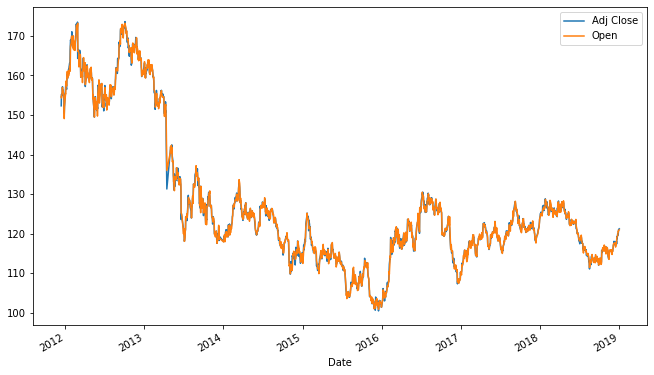

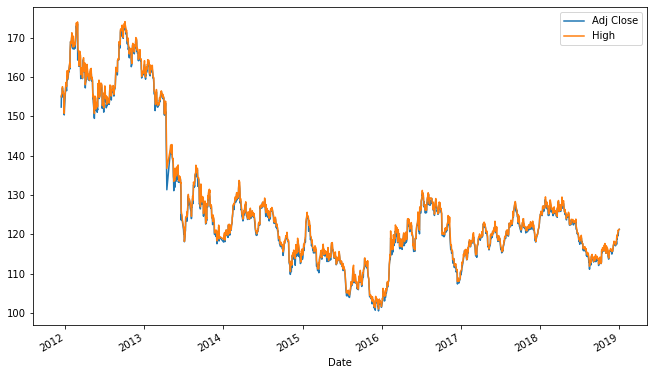

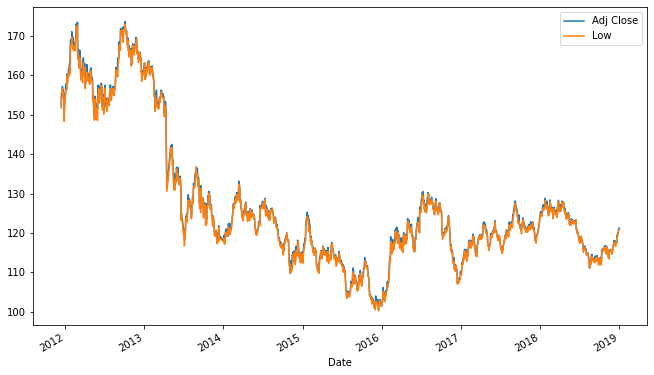

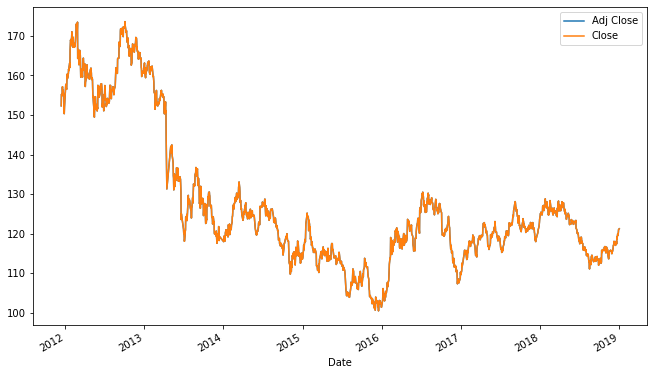

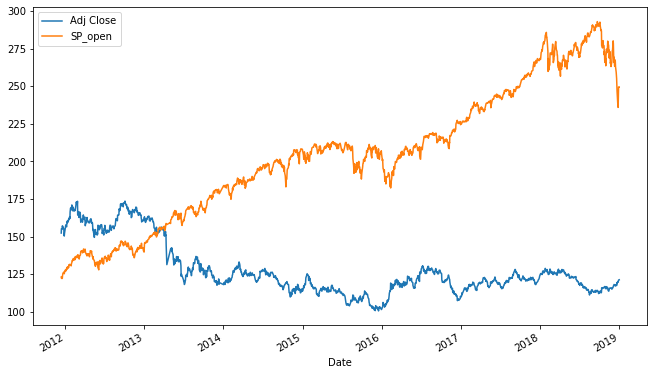

...

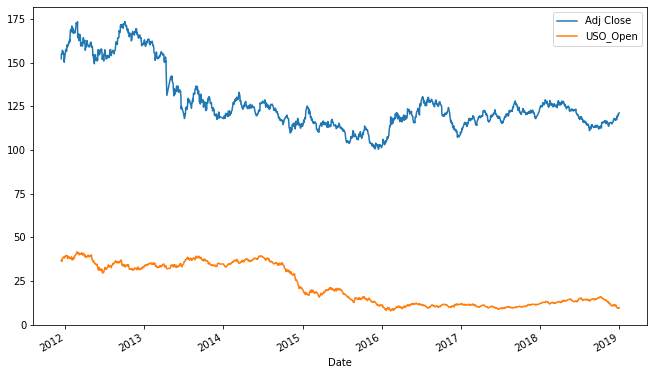

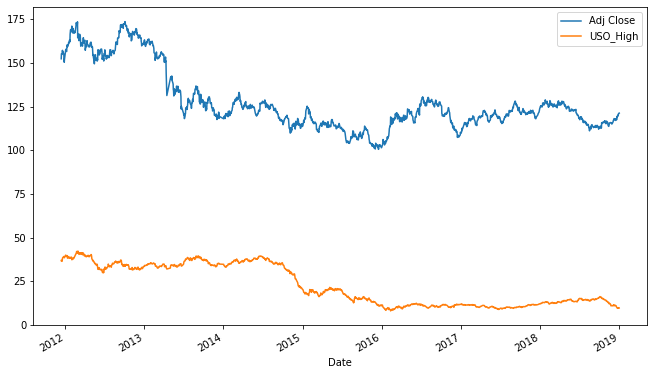

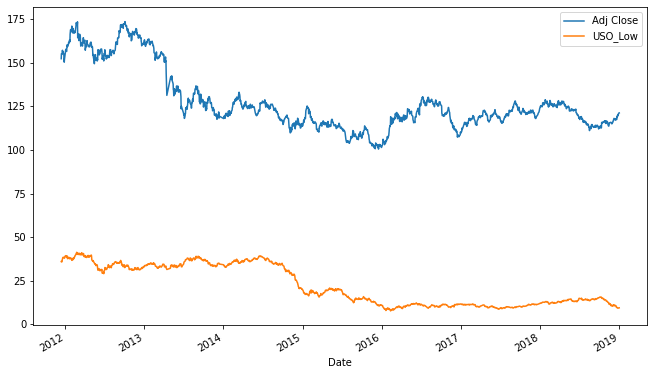

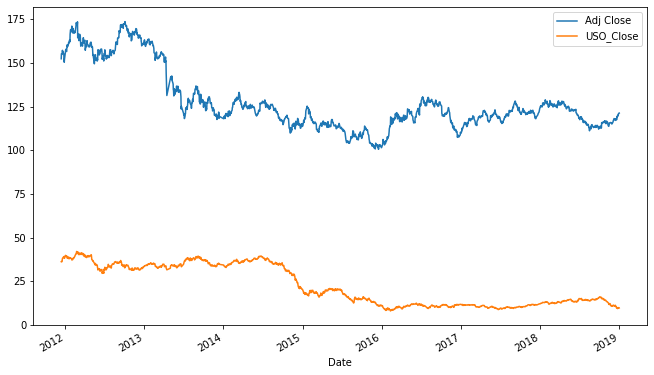

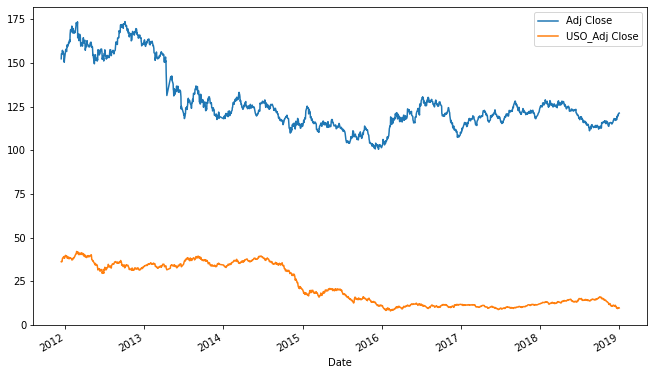

In [123]:
for col in df:
    if col not in volume + ['Adj Close', 'RHO_PRICE'] + DJ + EU + SF + USB + PLT + PLD and df[col].nunique()>2:
        plt.figure(figsize=(11, 6.5))
        df['Adj Close'].plot.line(label='Adj Close')
        df[col].plot.line(label = col)
        plt.legend()
    elif col in volume + ['Adj Close', 'RHO_PRICE'] + DJ + EU + SF + USB + PLT + PLD:
        plt.figure()
        df[col].plot('')

In [144]:
DF_pour_Normalisation = pd.concat([df['Adj Close'], df[[col for col in df if df[col].max() > df['Adj Close'].max()*5]]], axis=1)
DF_pour_Normalisation.head()

,Adj Close,Volume,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_volume,OF_Volume,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLD_Price,PLD_Open,PLD_High,PLD_Low,RHO_PRICE,USDI_Volume,GDX_Volume,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,152.330002,21521900,199109200,11825.29004,11967.83984,11825.21973,11868.80957,11868.80957,136930000,787900,14330,53604,54248,54248,52316,119440,1414.65,1420.30,1423.35,1376.85,618.85,614.70,615.00,614.60,1425,22850,20605600,12616700
2011-12-16,155.229996,18124300,220481400,11870.25000,11968.17969,11819.30957,11866.38965,11866.38965,389520000,896600,140080,53458,53650,54030,52890,65390,1420.25,1414.75,1431.75,1400.70,623.65,622.60,623.45,622.30,1400,13150,16285400,12578800
2011-12-19,154.869995,12547200,183903000,11866.54004,11925.87988,11735.19043,11766.25977,11766.25977,135170000,2096700,147880,52961,53400,53400,52544,67280,1411.10,1422.65,1427.60,1404.60,608.80,626.00,630.00,608.60,1400,970,15120200,7418200
2011-12-20,156.979996,9136300,225418100,11769.20996,12117.12988,11768.83008,12103.58008,12103.58008,165180000,875300,170240,53487,52795,53575,52595,55130,1434.75,1408.95,1436.55,1408.15,626.65,622.45,622.45,622.45,1400,22950,11644900,10041600
2011-12-21,157.160004,11996100,194230900,12103.58008,12119.70020,11999.44043,12107.74023,12107.74023,163250000,837600,145090,53148,53519,54184,52937,75950,1429.05,1434.40,1453.75,1417.65,635.90,625.70,641.50,623.80,1400,24140,8724300,10728000


In [146]:
DF_pour_Normalisation.columns

Index(['Adj Close', 'Volume', 'SP_volume', 'DJ_open', 'DJ_high', 'DJ_low',
       'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_volume', 'OF_Volume',
       'SF_Price', 'SF_Open', 'SF_High', 'SF_Low', 'SF_Volume', 'PLT_Price',
       'PLT_Open', 'PLT_High', 'PLT_Low', 'PLD_Price', 'PLD_Open', 'PLD_High',
       'PLD_Low', 'RHO_PRICE', 'USDI_Volume', 'GDX_Volume', 'USO_Volume'],
      dtype='object')

In [147]:
col = ['Adj Close', 'Volume', 'SP_volume', 'DJ_open', 'DJ_high', 'DJ_low',
       'DJ_close', 'DJ_Ajclose', 'DJ_volume', 'EG_volume', 'OF_Volume',
       'SF_Price', 'SF_Open', 'SF_High', 'SF_Low', 'SF_Volume', 'PLT_Price',
       'PLT_Open', 'PLT_High', 'PLT_Low', 'PLD_Price', 'PLD_Open', 'PLD_High',
       'PLD_Low', 'RHO_PRICE', 'USDI_Volume', 'GDX_Volume', 'USO_Volume']

In [148]:
st = StandardScaler()

In [151]:
DF_pour_Normalisation[col] = st.fit_transform(DF_pour_Normalisation[col])

In [152]:
DF_pour_Normalisation

,Adj Close,Volume,SP_volume,DJ_open,DJ_high,DJ_low,DJ_close,DJ_Ajclose,DJ_volume,EG_volume,OF_Volume,SF_Price,SF_Open,SF_High,SF_Low,SF_Volume,PLT_Price,PLT_Open,PLT_High,PLT_Low,PLD_Price,PLD_Open,PLD_High,PLD_Low,RHO_PRICE,USDI_Volume,GDX_Volume,USO_Volume
Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2011-12-15,1.426632,2.658016,1.813819,-1.629320,-1.607299,-1.615966,-1.621096,-1.621096,-0.338033,-0.477005,-2.382704,1.370725,1.449256,1.389475,1.263836,4.229908,0.842828,0.861309,0.831950,0.748711,-0.997917,-1.024509,-1.064191,-0.983073,0.516907,-0.322309,-0.789448,-0.419380
2011-12-16,1.592051,1.967348,2.247889,-1.617758,-1.607212,-1.617494,-1.621720,-1.621720,1.745355,-0.328083,-0.966898,1.351332,1.370032,1.360837,1.340977,1.759005,0.863284,0.841046,0.862457,0.836485,-0.965542,-0.971143,-1.007467,-0.930812,0.473035,-0.984920,-0.937995,-0.421786
2011-12-19,1.571516,0.833630,1.504981,-1.618712,-1.618045,-1.639248,-1.647504,-1.647504,-0.352550,1.316077,-0.879078,1.285317,1.336911,1.278074,1.294477,1.845407,0.829860,0.869889,0.847385,0.850838,-1.065701,-0.948176,-0.963498,-1.023796,0.473035,-1.816941,-0.978060,-0.749384
2011-12-20,1.691874,0.140258,2.348153,-1.643741,-1.569068,-1.630548,-1.560641,-1.560641,-0.105024,-0.357265,-0.627330,1.355184,1.256760,1.301063,1.301331,1.289968,0.916249,0.819870,0.879889,0.863903,-0.945308,-0.972157,-1.014180,-0.929794,0.473035,-0.315478,-1.097556,-0.582849
2011-12-21,1.702141,0.721601,1.714740,-1.557754,-1.568409,-1.570910,-1.559570,-1.559570,-0.120943,-0.408915,-0.910491,1.310156,1.352677,1.381068,1.347293,2.241757,0.895428,0.912788,0.942356,0.898865,-0.882919,-0.950203,-0.886299,-0.920632,0.473035,-0.234189,-1.197979,-0.539276
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-24,-0.416372,0.262247,0.761808,1.068807,1.048877,0.961591,0.934262,0.934262,1.076434,-0.658943,-1.685891,-0.762897,-0.792728,-0.797573,-0.753525,-0.797841,-1.444740,-1.433155,-1.438090,-1.417299,2.738324,2.682040,2.712486,2.704362,2.368281,-0.931638,0.582534,0.150771
2018-12-26,-0.436906,1.188619,2.207350,0.950629,1.186923,0.940987,1.213981,1.213981,2.104643,-0.533997,-1.677109,-0.668323,-0.755369,-0.680785,-0.717374,-0.342976,-1.405107,-1.444473,-1.416299,-1.415643,2.855007,2.767155,2.802439,2.823815,2.368281,-0.813461,1.127807,1.381063
2018-12-27,-0.384999,0.696862,1.553000,1.148985,1.253499,1.084487,1.281028,1.281028,1.897286,-0.537149,-1.388994,-0.610277,-0.667003,-0.642162,-0.649237,-0.332004,-1.418805,-1.405590,-1.423926,-1.429076,2.894801,2.862065,2.852114,2.864538,2.350732,-0.481472,0.303539,1.101742


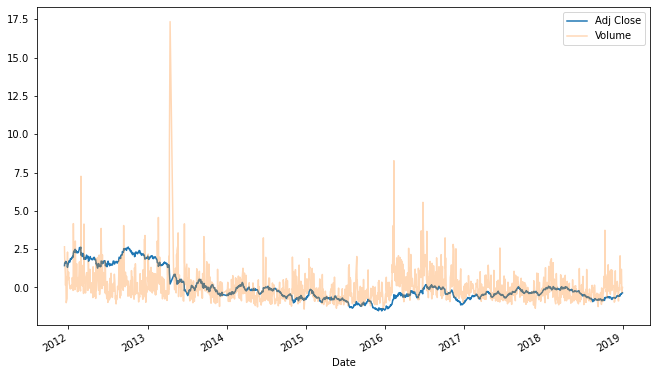

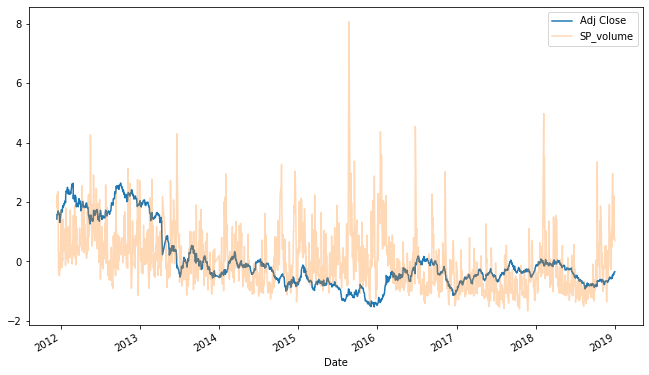

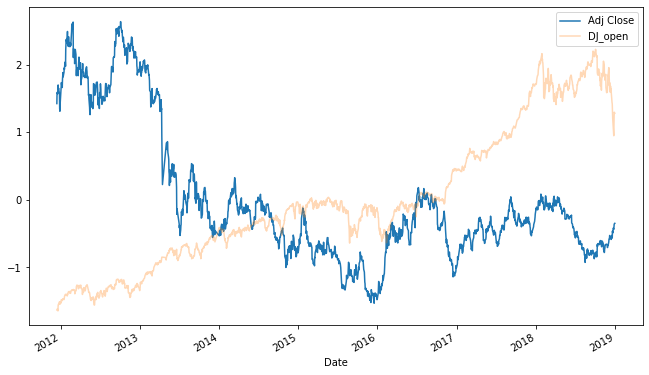

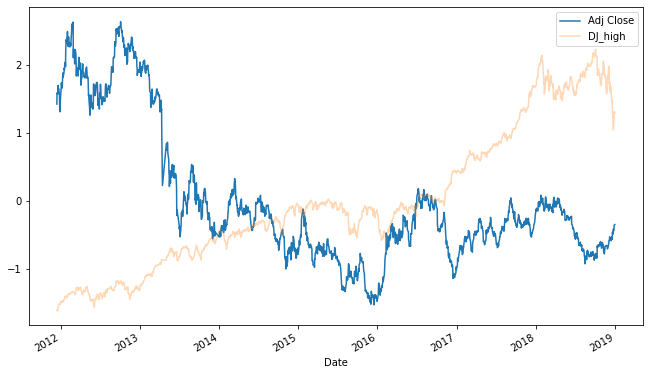

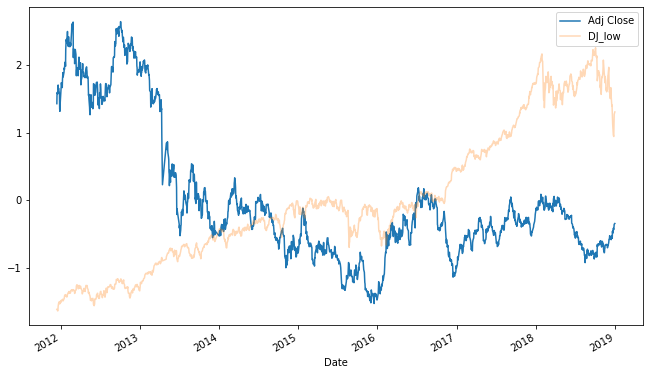

...

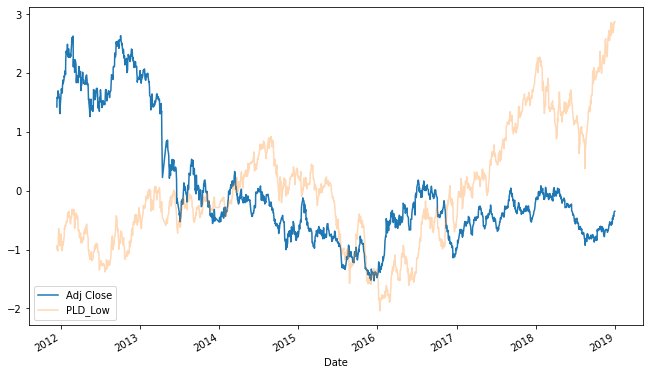

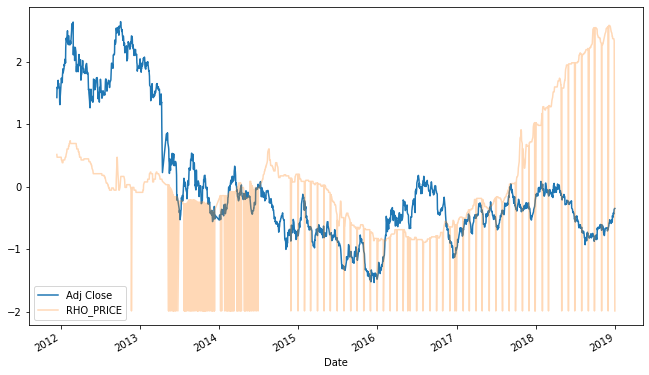

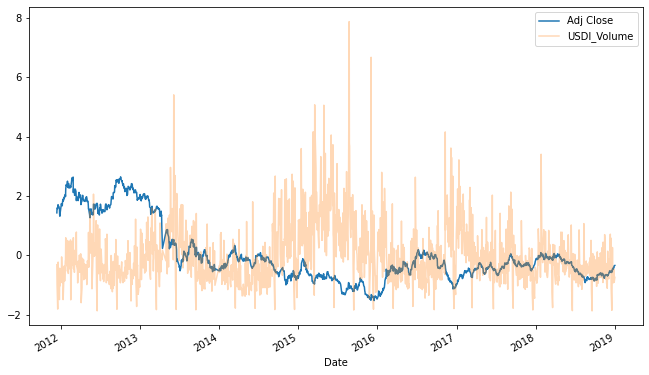

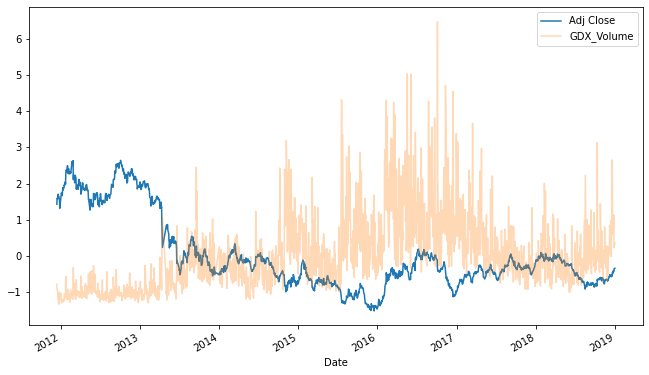

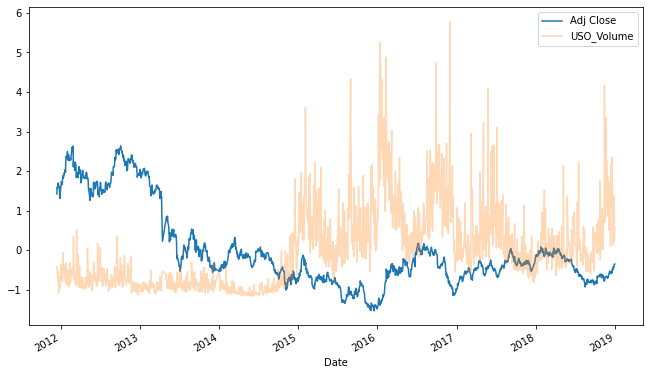

In [159]:
for col in DF_pour_Normalisation:
    if col not in 'Adj Close':
        plt.figure(figsize=(11, 6.5))
        DF_pour_Normalisation['Adj Close'].plot.line(label='Adj Close')
        DF_pour_Normalisation[col].plot.line(label=col, alpha=.3)
        plt.legend()

### 

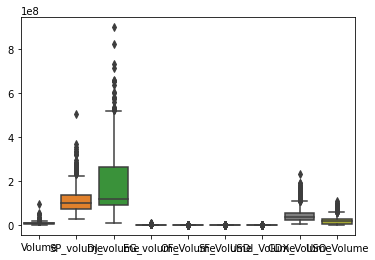

In [169]:
sns.boxplot(data=df[volume], )

In [172]:
df.corr()['Adj Close'].sort_values()

USDI_Low        -0.722078
USDI_Price      -0.721569
USDI_Open       -0.720140
USDI_High       -0.720023
SP_high         -0.684904
SP_open         -0.684618
SP_close        -0.684284
SP_low          -0.683750
SP_Ajclose      -0.666071
DJ_open         -0.588800
DJ_high         -0.588778
DJ_Ajclose      -0.588411
DJ_close        -0.588411
DJ_low          -0.588157
GDX_Volume      -0.514616
USB_High        -0.464116
USO_Volume      -0.456193
USB_Price       -0.441347
USB_Open        -0.440822
USB_Low         -0.417352
OF_Volume       -0.225436
PLD_High        -0.217490
PLD_Open        -0.216426
PLD_Low         -0.214919
PLD_Price       -0.213179
USDI_Volume     -0.205954
DJ_volume       -0.155526
EG_volume       -0.126586
USB_Trend       -0.025933
USDI_Trend      -0.016641
PLT_Trend        0.011355
EU_Trend         0.019913
PLD_Trend        0.026536
SF_Trend         0.028100
OF_Trend         0.048205
OS_Trend         0.059510
RHO_PRICE        0.095782
SP_volume        0.241949
Volume      

In [187]:
def outliers(v):
    Q1 = np.quantile(v, 0.25)  
    Q3 = np.quantile(v, 0.75)
    EIQ = Q3 - Q1
    LI = Q1 - (EIQ*1.5)
    LS = Q3 + (EIQ*1.5)    
    i = list(v.index[(v < LI) | (v > LS)])
    val = list(v[i])
    return val

In [210]:
for col in df.columns:
    print(col)
    print("Les outliers de: ", col, "Commencent de: ", outliers(df[col])[0], "jusqu'à: ", df[col].max())

Open
Les outliers de:  Open Commencent de:  154.740005 jusqu'à:  173.199997
High
Les outliers de:  High Commencent de:  154.949997 jusqu'à:  174.070007
Low
Les outliers de:  Low Commencent de:  151.71000700000005 jusqu'à:  172.919998
Close
Les outliers de:  Close Commencent de:  152.330002 jusqu'à:  173.610001
Adj Close
Les outliers de:  Adj Close Commencent de:  152.330002 jusqu'à:  173.610001
Volume
Les outliers de:  Volume Commencent de:  21521900 jusqu'à:  93804200
SP_open


IndexError: list index out of range